In [1]:
import xgi
import hypercontagion as hc
import matplotlib.pyplot as plt
import time
import numpy as np
import random
import networkx as nx
from IPython.display import HTML
import matplotlib.animation as animation
from model_generation import *
from sod.simpliciality import edit_simpliciality, face_edit_simpliciality, simplicial_fraction, new_edit_simpliciality

In [ ]:
print(combination_to_size(12))
#node = 1000
#max hyperedge = 2000
#approx_num_C = 8000

5


In [18]:
H1 = xgi.load_xgi_data("disgenenet")
H2 = xgi.load_xgi_data("email-enron")
H1.cleanup(connected=True)
print("H1_old_es", edit_simpliciality(H1))
print("H1_new_es", new_edit_simpliciality(H1))
# print("H2_es", edit_simpliciality(H2))
print("H1.num_nodes", H1.num_nodes)
print("H1.num_edges", len(H1.edges.filterby("size", 2, "geq").members()))
print("len(H1.edges.maximal())", len(H1.edges.maximal().filterby("size", 2, "geq").members()))
# print("H2.num_nodes", H2.num_nodes)
# print("H2.num_edges", H2.num_edges)
# print("len(H2.edges.maximal())", len(H2.edges.maximal()))
nums = xgi.connected_components(H1)
count = 0
for i in nums:
    count += 1
print("xgi.number_connected_components(H1)", count)
# print("xgi.number_connected_components(H2)", xgi.number_connected_components(H2))

# H2.cleanup()

# print("H2_new_es", edit_simpliciality(H2))









JSONDecodeError: Expecting value: line 5 column 1 (char 4)

In [46]:
# print(H1.num_nodes)
# print(H1.num_edges)
# print("H1.num_edges", len(H1.edges.filterby("size", 2, "geq").members()))
# print(len(H1.edges.maximal()))
H = model_generation_es(
        es=0.8,
        approx_num_C=4000,  # Set high to allow target_num_edges to work
        num_max_hyperedge=2000,
        num_node=1000,
        min_size=2,
        max_size=None,
        adjust_es=True,
        compare_interval_smaller_case=10,
        compare_interval_bigger_case=10,
    )
print("H.num_nodes", H.num_nodes)
print("H.num_edges", H.num_edges)
print("H1.num_edges", len(H.edges.filterby("size", 2, "geq").members()))
print(len(H.edges.maximal()))
print(new_edit_simpliciality(H))
print("xgi.number_connected_components(H)", xgi.number_connected_components(H))

excess: 319
H.num_nodes 1000
H.num_edges 4971
H.num_edges without singletons 4971
len(H.edges.maximal()) 2000
H.num_nodes 1000
H.num_edges 4971
H1.num_edges 4971
2000
0.7995156081808397
xgi.number_connected_components(H) 1


In [3]:
print(xgi.number_connected_components(H))
print("edit_simpliciality(H)", edit_simpliciality(H))
print("new_edit_simpliciality(H)", new_edit_simpliciality(H))
print("H.num_nodes", H.num_nodes)
print("H.num_edges", H.num_edges)
print("H1.num_edges", len(H.edges.filterby("size", 2, "geq").members()))
print("H1.num_maximal_edges", len(H.edges.maximal()))
H.cleanup(connected=True)
print("--------------------------------")
print("edit_simpliciality(H)", edit_simpliciality(H))
print("new_edit_simpliciality(H)", new_edit_simpliciality(H))
print("H.num_nodes", H.num_nodes)
print("H.num_edges", H.num_edges)
print("H1.num_edges", len(H.edges.filterby("size", 2, "geq").members()))
print("H1.num_maximal_edges", len(H.edges.maximal()))

244
edit_simpliciality(H) 0.2917562307558241
new_edit_simpliciality(H) 0.2791935197776858
H.num_nodes 1000
H.num_edges 5022
H1.num_edges 5022
H1.num_maximal_edges 300
--------------------------------
edit_simpliciality(H) 0.2917562307558241
new_edit_simpliciality(H) 0.2791935197776858
H.num_nodes 757
H.num_edges 5022
H1.num_edges 5022
H1.num_maximal_edges 300


In [7]:
gamma = 0.05
beta = 0.05
tau = {i: beta for i in xgi.unique_edge_sizes(H)}
rho = 0.1

In [8]:
transition_events = hc.discrete_SIR(
    H, tau, gamma, tmin=0, dt=1, rho=rho, return_event_data=True
)

In [9]:
pos = xgi.pairwise_spring_layout(H)

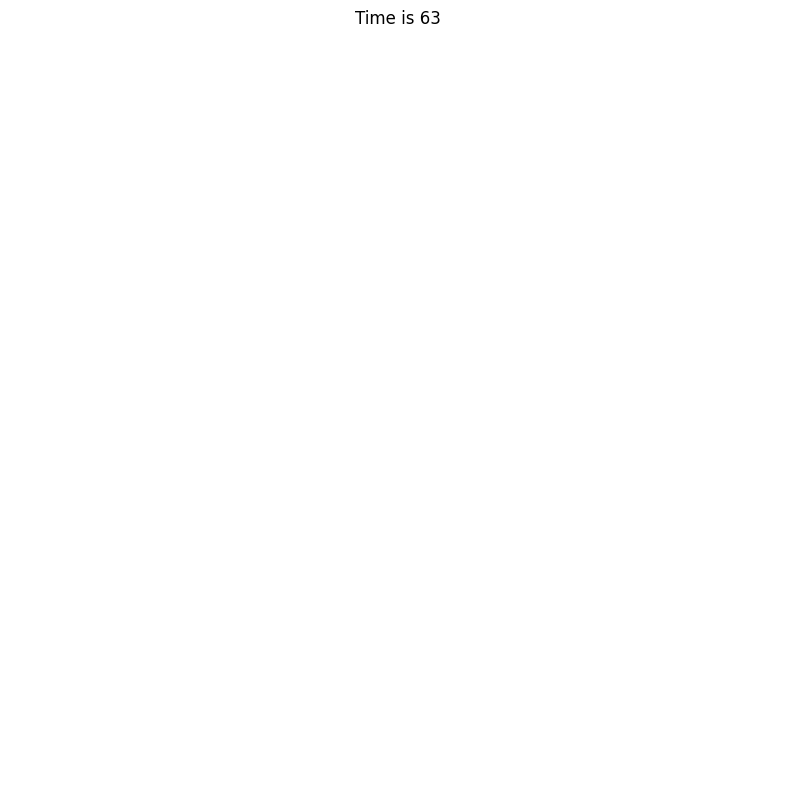

In [10]:
S_color = "white"
I_color = 'firebrick'
R_color = 'steelblue'

node_colors = {"S": S_color, "I": I_color, "R": R_color}
edge_colors = {"S": S_color, "I": I_color, "R": R_color, "OFF": "grey"}
fps = 1
fig = plt.figure(figsize=(10, 10))
anim = hc.contagion_animation(
    fig, H, transition_events, pos, node_colors, edge_colors, fps=fps
)
# FFwriter = animation.FFMpegWriter(fps=fps)
# anim.save('animation.mp4', writer = FFwriter)

In [11]:
HTML(anim.to_jshtml())